#### Loading SAMPLE VID

In [2]:
from datetime import datetime
import os

now = datetime.now()
date = now.strftime("%Y_%m_%d")

In [10]:
font = "/Users/troydo42/Desktop/Body_Matrixes/Roboto-Bold.ttf"
sample_folder = "/Users/troydo42/Desktop/Body_Matrixes/samples"

left_file = "sample02.mp4"
middle_file="sample05.mp4"
right_file = "sample10.mp4"
min_accuracy = 0.9

output_folder = os.path.join("/Users/troydo42/Desktop/Body_Matrixes/", "outputs")

In [11]:
cd "$sample_folder"

/Users/troydo42/Desktop/Body_Matrixes/samples


In [12]:
ls

man.mp4       sample03.mp4  sample06.mp4* sample09.mp4*
sample01.mp4  sample04.mp4* sample07.mp4* sample10.mp4
sample02.mp4* sample05.mp4* sample08.mp4*


In [13]:
import os

left_video_path = os.path.join(sample_folder, left_file)
middle_video_path = os.path.join(sample_folder, middle_file)
right_video_path = os.path.join(sample_folder, right_file)

In [14]:
### Loading Video
import os
import av
import math
import random
from torchvision.io import read_video
from torchvision.transforms.functional import to_pil_image

def load_video(video_path, rotate):
    video, audio, meta = read_video(video_path, pts_unit="sec", output_format="TCHW")
    frame_counts = len(video)
    fps = meta['video_fps']
    print(frame_counts, fps)
    sample_index = random.randrange(frame_counts)
    sample_frame = to_pil_image(video[sample_index])
    sample_frame = sample_frame.rotate(rotate, expand=True)
    return video, frame_counts, fps, sample_frame

83 29.88


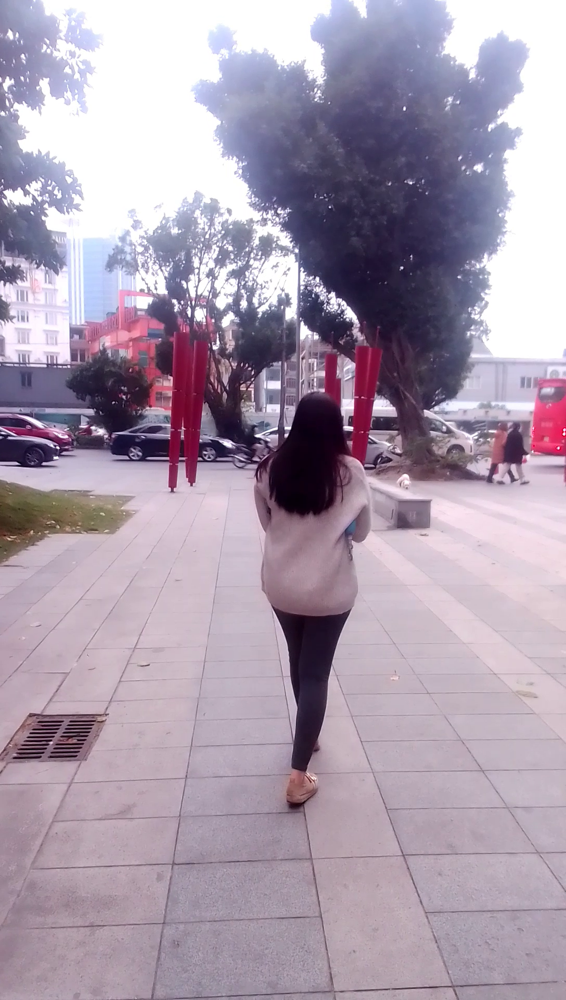

In [15]:
left_vid, left_counts, left_fps, left_sample = load_video(left_video_path, -90)
left_sample

55 29.879756615800655


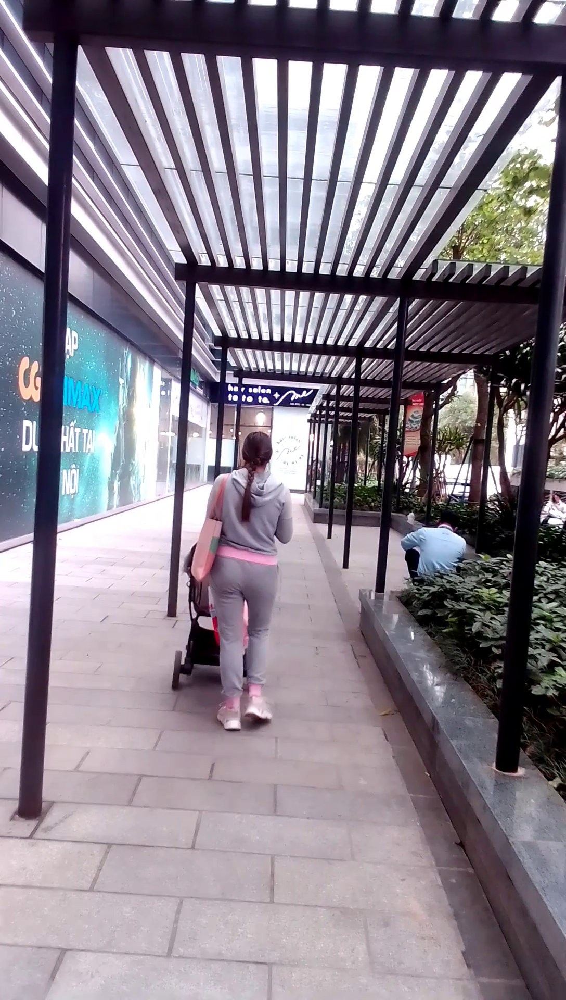

In [17]:
middle_vid, middle_counts, middle_fps, middle_sample = load_video(middle_video_path, -90)
middle_sample

35 29.88073915512647


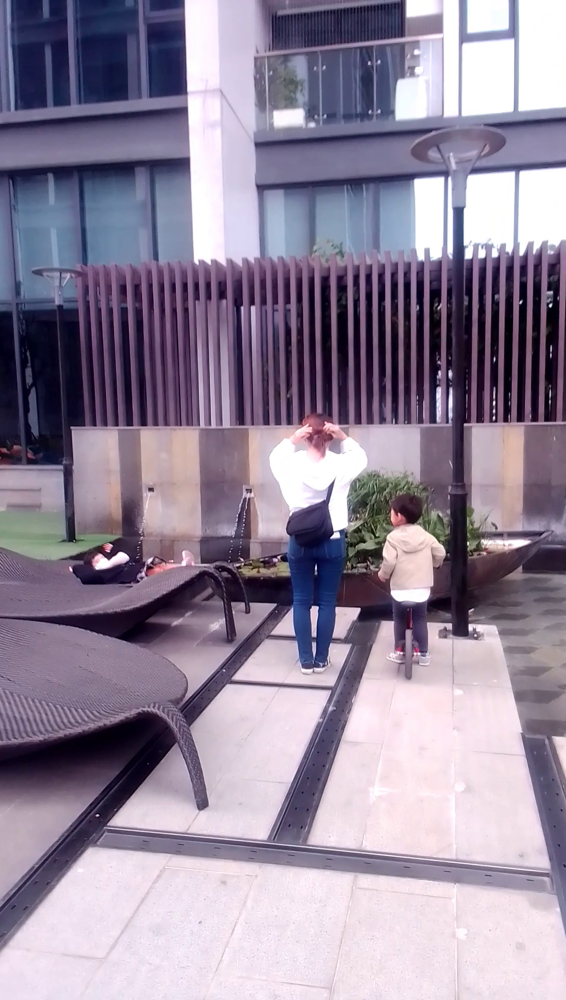

In [28]:
right_vid, right_counts, right_fps, right_sample = load_video(right_video_path, -90)
right_sample

In [219]:
# if left_sample.width  > right_sample.width:
#     left_sample = left_sample.resize((right_sample.width, right_sample.height))
# elif left_sample.width  < right_sample.width:
#     right_sample = right_sample.resize((left_sample.width, left_sample.height))

In [220]:
# print(left_sample.width, right_sample.width)

1088 1088


In [29]:
### Function to calculate Bouding Box Area and Range from Center

def center(bbox):
    center_x = (bbox[2] + bbox[0])/2
    center_y = (bbox[3] + bbox[1])/2
    center = [center_x, center_y]
    return center

def dfc(pic, bbox):
    pic_width = pic.width
    pic_height = pic.height
    
    pic_center = center([0,0, pic_width, pic_height])
    bbox_center = center(bbox)
    
    x_dif = bbox_center[0] - pic_center[0]
    y_dif = bbox_center[1] - pic_center[1]
    bbox_width = bbox[2] - bbox[0]
    bbox_height = bbox[3] - bbox[1] 
    distance = math.sqrt(x_dif * x_dif + y_dif * y_dif)
    area = abs(bbox_width * bbox_height)
    return distance, area

In [30]:
def bodyRatio(kp):
    ls = kp[0][5]
    rs = kp[0][6]

    lh = kp[0][11]
    rh = kp[0][12]

    la = kp[0][15]
    ra = kp[0][16]

    def legToBack(s, h, a):
        return (a-h)/(h-s)

    def hipToShoulder(lh, rh, ls, rs):
        return (rh-lh)/(rs-ls)

    if la[1] >= ra[1]:
        legRatio = legToBack(ls[1], lh[1], la[1])
    else:
        legRatio = legToBack(rs[1], rh[1], ra[1])
        
    hipRatio = hipToShoulder(lh[0], rh[0], ls[0], rs[0])
    
    leg_back = legRatio.item()
    hip_shoulder = hipRatio.item()
    
    # Type one
    #     score = round(
    #         (abs(leg_back) - 1 + (abs(hip_shoulder)-0.5)*4),
    #     3)*1000
    #     print(score, leg_back, hip_shoulder)
    
    # Type two
    # score = round(abs(1-(leg_back*hip_shoulder-0.08))*1000, 1)
    
    # Type three
    score = int(round(leg_back + 2 * hip_shoulder, 2)*100)
    
    points = [
        [ls[0].item(), ls[1].item()],
        [rs[0].item(), rs[1].item()],
        [lh[0].item(), lh[1].item()], 
        [rh[0].item(), rh[1].item()], 
        [la[0].item(), la[1].item()], 
        [ra[0].item(), ra[1].item()]
    ]
    
    print(score, leg_back, hip_shoulder)
    
    return score, leg_back, hip_shoulder, points

In [31]:
from PIL import ImageDraw, ImageFont

def drawMarkers(coordinates, image):
    marker_font = ImageFont.truetype("Roboto-Bold.ttf", 10)
    
    sample = image.copy()
    draw = ImageDraw.Draw(sample) 
            
    for index, point in enumerate(coordinates):
        label = index + 1
        radius = 10

        draw.ellipse(
            [(point[0]-radius, point[1]-radius), (point[0]+radius, point[1]+radius)],
            fill="#40389F",
            outline="#ffffff",
            width=1
        )

        draw.text(
            (point[0]-3, point[1]-5),
            str(label),
            fill="#FAFF00",
            font=marker_font,
            align="center"
        )
    return sample

def addData(image, data): 
    width = image.width
    sample = image.copy()
    draw = ImageDraw.Draw(sample) 
    top_margin = 100

    draw.rectangle(
        [(width/2-200,top_margin), (width/2+200, top_margin+130)], 
        fill="#40389F", 
        outline=None
    )

    title_font = ImageFont.truetype("Roboto-Bold.ttf", 31)
    data_font = ImageFont.truetype("Roboto-Bold.ttf", 41)

    draw.text(
        (width/2-120,top_margin+20),
        "Body Matrix Score",
        fill="#FAFF00",
        font=title_font,
        align="center"
    )

    draw.text(
        (width/2-40,top_margin+60),
        data,
        fill="#FAFF00",
        font=data_font,
        align="center"
    )


    return sample

In [32]:
### Loading Keypoints Models
from torchvision.models.detection import keypointrcnn_resnet50_fpn, KeypointRCNN_ResNet50_FPN_Weights

weights = KeypointRCNN_ResNet50_FPN_Weights.COCO_V1
model =  keypointrcnn_resnet50_fpn(weights=weights)
transforms = weights.transforms()

model.eval().to("cpu")

KeypointRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(640, 672, 704, 736, 768, 800), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.

In [33]:
### Frame Keypoints Prediction and Visualization
import torch
from torchvision.utils import draw_keypoints, draw_bounding_boxes
from torchvision.transforms.functional import pil_to_tensor

def detect(pos, frame):
    ### Make Predictions on Frame
    body_matrix = transforms(frame)
    predictions = model([body_matrix.to("cpu")])

    ### Extract Boxes, Scores and Keypoints from frame
    boxes = predictions[0]['boxes']
    keypoints = predictions[0]['keypoints']
    scores = predictions[0]['scores']

    ### Filter for the main Bounding Box and Keypoints
    idx = torch.where(scores > min_accuracy)
    
    main_boxes = torch.unsqueeze(boxes[idx], dim=1)
    index = 0
    max_area = 0
    max_distance = frame.width/3

    for selector, box in enumerate(main_boxes):
        bbox = [
            box[0][0].item(), 
            box[0][1].item(),
            box[0][2].item(),
            box[0][3].item()
        ]
        
        distance, area = dfc(frame, bbox) 
        if distance < max_distance and area > max_area:
            max_area = area
            index = selector
            # print("Selected", area, selector, distance)
        # else:
            # print("Not selected", area, selector, distance)
    
    bx = torch.unsqueeze(boxes[idx][index], dim=0)
    kp = torch.unsqueeze(keypoints[idx][index], dim=0)
    score, legRatio, hipRatio, points = bodyRatio(kp)
    
    labels = [f'SCORE: {score}']
    # print(f"Main Index: {main_index}, Score: {score}")
    
    ### Draw Keypoints and Bounding Boxes
    tensor_image = pil_to_tensor(frame)
    ### keypoints_image = draw_keypoints(tensor_image, kp, colors="yellow", radius=3)
    
    final_image = draw_bounding_boxes(
        tensor_image, 
        bx, 
        colors="blue", 
        fill=True, 
    )
    
    pil_image = to_pil_image(final_image)
    points_image = drawMarkers(points, pil_image)
    final_image = addData(points_image, f"{score}")

    return final_image, score

In [34]:
cd "$output_folder"

/Users/troydo42/Desktop/Body_Matrixes/outputs


In [35]:
mkdir "$date"

mkdir: 2022_12_15: File exists


In [36]:
cd "$date"

/Users/troydo42/Desktop/Body_Matrixes/outputs/2022_12_15


In [41]:
from PIL import Image

def stitch(left_frame, middle_frame, right_frame):
    left_cal, left_score = detect("left", left_frame)
    middle_cal, middle_score = detect("middle", middle_frame)
    right_cal, right_score = detect("right", right_frame)

    width = left_cal.width + middle_cal.width + right_cal.width
    height = left_cal.height

    full_screen = Image.new("RGB",(width, height))
    full_screen.paste(im=left_cal, box=(0,0))
    full_screen.paste(im=middle_cal, box=(left_cal.width, 0))
    full_screen.paste(im=right_cal, box=(left_cal.width*2, 0))
    return full_screen, left_score, middle_score, right_score

output, left_score, middle_score, right_score = stitch(left_sample, middle_sample, right_sample)

279 1.5974839925765991 0.5982908606529236
287 1.5299147367477417 0.6710526347160339
285 1.5288457870483398 0.6617653965950012


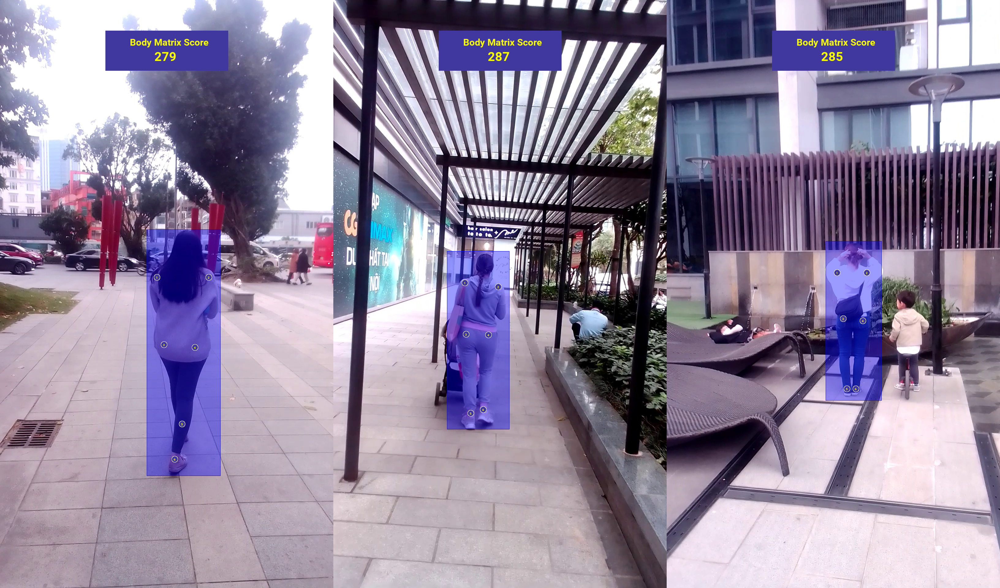

In [42]:
output

In [51]:
output_image =  str(left_score)+ "_" +str(middle_score)+"_"+ str(right_score) +"_Body_Matrix_Scores_" + left_file[0:-4] + "_vs_" +middle_file[0:-4] +"_vs_"+right_file[0:-4] + ".png"
output.save(output_image)

In [52]:
def video_processing(left_vid, middle_vid, right_vid):
    frame_counts = min(len(left_vid), len(middle_vid), len(right_vid))
    container = av.open(output_video, mode="w")
    stream = container.add_stream("mpeg4", rate=math.floor(left_fps))
    stream.width = output.width
    stream.height = output.height
    
    left_sample_scores = []
    middle_sample_scores = []
    right_sample_scores = []
    
    def encode(image):
        frame = av.VideoFrame.from_image(image)
        for packet in stream.encode(frame):
            container.mux(packet)
    
    for idx in range(frame_counts):
        print(f"Processing {idx+1} of {frame_counts} ", end="\r")
        
        left_frame = to_pil_image(left_vid[idx])
        left_frame = left_frame.rotate(-90, expand=True)
        
        middle_frame = to_pil_image(middle_vid[idx])
        middle_frame = middle_frame.rotate(-90, expand=True)
        
        right_frame = to_pil_image(right_vid[idx])
        right_frame = right_frame.rotate(-90, expand=True)
        
        stitched_frame, left_score, middle_score, right_score = stitch(left_frame, middle_frame, right_frame)
        
        left_sample_scores.append(left_score)
        middle_sample_scores.append(middle_score)
        right_sample_scores.append(right_score)
        
        encode(stitched_frame)
    
    container.close()
    return left_sample_scores, middle_sample_scores, right_sample_scores

In [53]:
output_video = str(left_score)+ "_" +str(middle_score)+"_"+ str(right_score) +"_Body_Matrix_Scores_" + left_file[0:-4] + "_vs_" +middle_file[0:-4] +"_vs_"+right_file[0:-4] + ".mp4"

In [54]:
left_sample_scores, middle_sample_scores, right_sample_scores = video_processing(left_vid, middle_vid, right_vid)

277 1.477611780166626 0.6439390182495117
283 1.4800010919570923 0.6730771064758301
279 1.4519219398498535 0.6666660904884338
286 1.56281316280365 0.6507935523986816
281 1.4771236181259155 0.6666663885116577
273 1.4666669368743896 0.6307691335678101
284 1.5736043453216553 0.6343288421630859
288 1.5424835681915283 0.6699999570846558
259 1.4036685228347778 0.5915502905845642
293 1.6062179803848267 0.6615384221076965
286 1.5424827337265015 0.6565654277801514
269 1.4761909246444702 0.6086954474449158
292 1.6102557182312012 0.6541351675987244
290 1.5496692657470703 0.6767675280570984
271 1.490384578704834 0.6086958050727844
294 1.666667103767395 0.6390979886054993
284 1.5496684312820435 0.6464648246765137
260 1.4196429252624512 0.589040994644165
286 1.5515459775924683 0.6532257795333862
284 1.549668788909912 0.6464648842811584
269 1.4571428298950195 0.614285945892334
280 1.587912678718567 0.6044774651527405
289 1.5620924234390259 0.6632654666900635
23 1.5142853260040283 -0.6428572535514832
2

In [55]:
print(left_sample_scores)

[277, 286, 284, 293, 292, 294, 286, 280, 268, 266, 287, 290, 285, 272, 273, 258, 258, 261, 250, 257, 252, 265, 262, 273, 272, 275, 271, 275, 273, 278, 288, 287, 285, 283, 279]


In [56]:
print(middle_sample_scores)

[283, 281, 288, 286, 290, 284, 284, 289, 287, 294, 285, 288, 283, 296, 291, 285, 293, 296, 301, 297, 287, 283, 283, 308, 310, 312, 300, 300, 301, 334, 336, 322, 339, 337, 332]


In [57]:
print(right_sample_scores)

[279, 273, 259, 269, 271, 260, 269, 23, 288, -4146, 285, 280, 289, 291, -4637, -2973, -4430, 308, 297, 303, 313, 310, 299, 294, 300, 298, 303, 294, 301, 291, 289, 287, 279, 276, 261]


In [105]:
import numpy as np
import seaborn as sns

def best_scores(array):
    scores = []
    for x in array:
        if x > 350 or x <  200:
            pass
        else:
            scores.append(x)
    np_scores = np.array(scores)
    mean = np.mean(np_scores)
    median = np.median(np_scores)
    minim = np.min(np_scores)
    maxim = np.max(np_scores)
    histogram_scores = np.histogram(np_scores)
    print(histogram_scores)
    sns.distplot(np_scores, hist=True)
    
    return mean, median, minim, maxim
    

(array([2, 3, 2, 2, 2, 7, 4, 4, 5, 4]), array([250. , 254.4, 258.8, 263.2, 267.6, 272. , 276.4, 280.8, 285.2,
       289.6, 294. ]))


(275.2857142857143, 275.0, 250, 294)

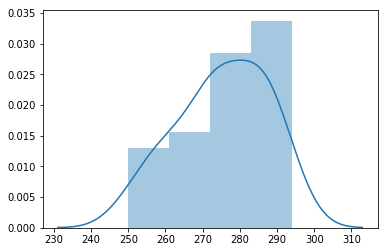

In [106]:
best_scores(left_sample_scores)

(array([10,  7,  5,  4,  1,  2,  0,  1,  1,  4]), array([281. , 286.8, 292.6, 298.4, 304.2, 310. , 315.8, 321.6, 327.4,
       333.2, 339. ]))


(299.0, 293.0, 281, 339)

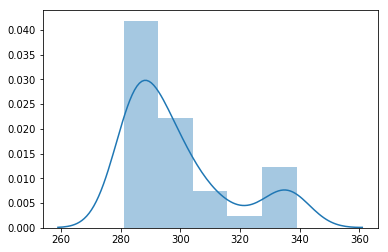

In [107]:
best_scores(middle_sample_scores)

(array([3, 2, 2, 4, 1, 6, 2, 5, 2, 3]), array([259. , 264.4, 269.8, 275.2, 280.6, 286. , 291.4, 296.8, 302.2,
       307.6, 313. ]))


(287.2, 289.0, 259, 313)

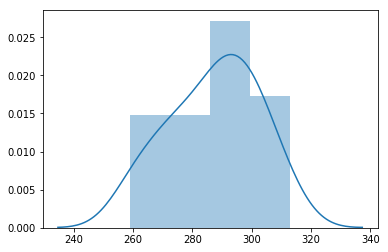

In [108]:
best_scores(right_sample_scores)